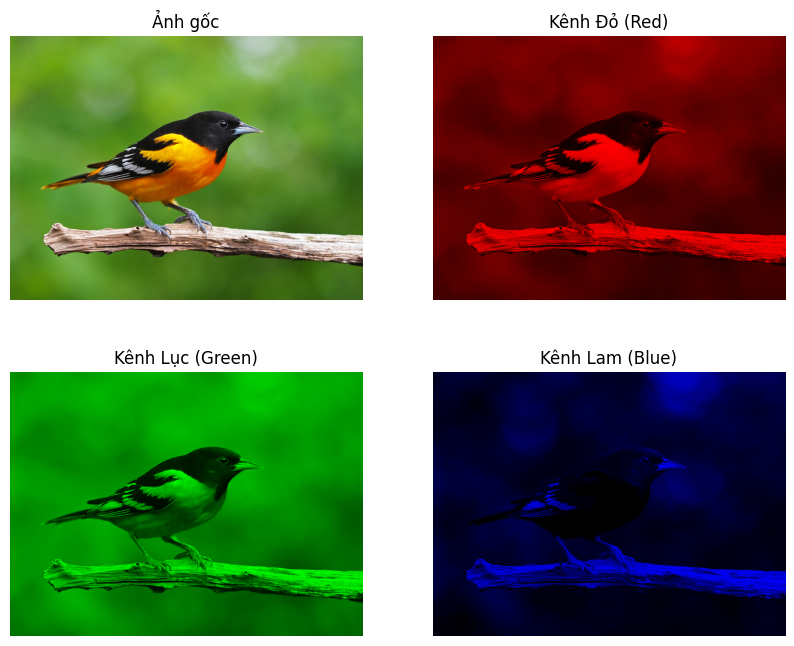

In [ ]:
#Bài 1
import imageio.v3 as iio
import numpy as np
import matplotlib.pyplot as plt

image = iio.imread('bird.png')

#kênh đỏ
red_image = np.zeros_like(image)
red_image[:, :, 0] = image[:, :, 0]

#kênh lục
green_image = np.zeros_like(image)
green_image[:, :, 1] = image[:, :, 1]

#kênh lam
blue_image = np.zeros_like(image)
blue_image[:, :, 2] = image[:, :, 2]
iio.imwrite('red_bird.png', red_image)
iio.imwrite('green_bird.png', green_image)
iio.imwrite('blue_bird.png', blue_image)
plt.figure(figsize=(10, 8))

plt.subplot(2, 2, 1)
plt.imshow(image)
plt.title('Ảnh gốc')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(red_image)
plt.title('Kênh Đỏ (Red)')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(green_image)
plt.title('Kênh Lục (Green)')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(blue_image)
plt.title('Kênh Lam (Blue)')
plt.axis('off')
plt.show()


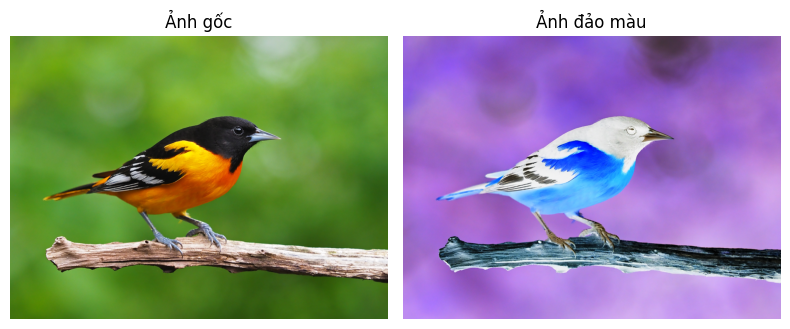

In [ ]:
#Bài 2
import imageio.v3 as iio
import numpy as np
import matplotlib.pyplot as plt

image = iio.imread('bird.png')  
inverted_image = 255 - image

iio.imwrite('inverted_image.png', inverted_image)

# Hiển thị ảnh gốc và ảnh đảo màu
plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Ảnh gốc')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(inverted_image)
plt.title('Ảnh đảo màu')
plt.axis('off')

plt.tight_layout()
plt.show()


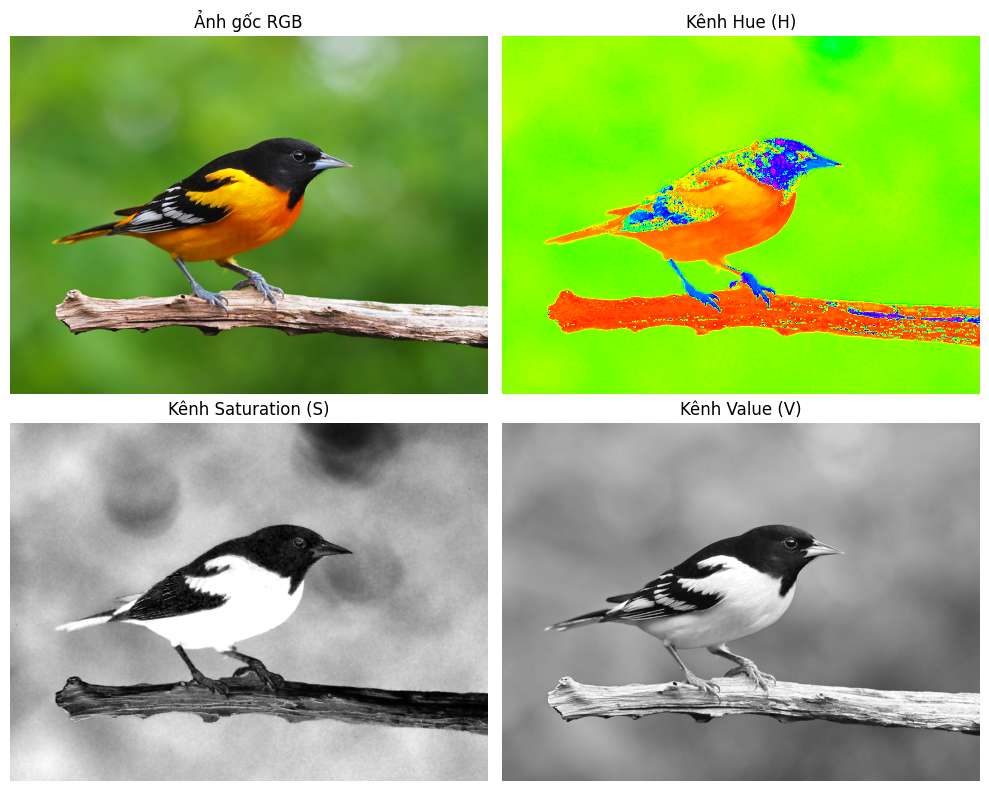

In [ ]:
#Bài 3
import numpy as np
import imageio.v2 as iio
import matplotlib.pylab as plt
import colorsys

image = iio.imread('bird.png')

image_norm = image / 255.0

height, width, _ = image.shape

H = np.zeros((height, width), dtype=np.float32)
S = np.zeros((height, width), dtype=np.float32)
V = np.zeros((height, width), dtype=np.float32)

#RGB -> HSV
for i in range(height):
    for j in range(width):
        r, g, b = image_norm[i, j]
        h, s, v = colorsys.rgb_to_hsv(r, g, b)
        H[i, j] = h  # range: 0–1
        S[i, j] = s
        V[i, j] = v

H_img = (H * 255).astype(np.uint8)
S_img = (S * 255).astype(np.uint8)
V_img = (V * 255).astype(np.uint8)

# Lưu ảnh kênh H, S, V
iio.imwrite('hue_channel.png', H_img)
iio.imwrite('saturation_channel.png', S_img)
iio.imwrite('value_channel.png', V_img)

# Hiển thị ảnh
plt.figure(figsize=(10, 8))

plt.subplot(2, 2, 1)
plt.imshow(image)
plt.title("Ảnh gốc RGB")
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(H_img, cmap='hsv')
plt.title("Kênh Hue (H)")
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(S_img, cmap='gray')
plt.title("Kênh Saturation (S)")
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(V_img, cmap='gray')
plt.title("Kênh Value (V)")
plt.axis('off')

plt.tight_layout()
plt.show()


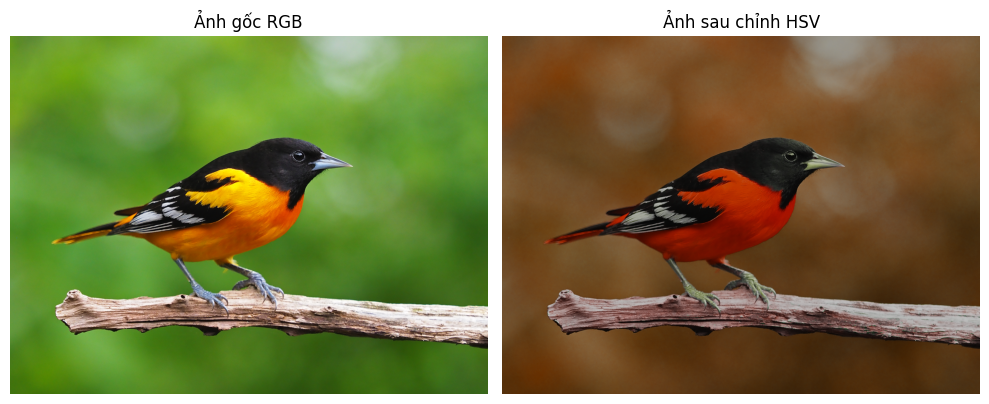

In [ ]:
#Bài 4
import numpy as np
import imageio.v2 as iio
import matplotlib.pylab as plt
import colorsys

image = iio.imread('bird.png')
image_norm = image / 255.0  # Chuẩn hóa về [0, 1]

height, width, _ = image.shape

modified_rgb = np.zeros_like(image_norm)

for i in range(height):
    for j in range(width):
        r, g, b = image_norm[i, j]
        h, s, v = colorsys.rgb_to_hsv(r, g, b)

        h_new = (1/3) * h
        v_new = (3/4) * v

        r_new, g_new, b_new = colorsys.hsv_to_rgb(h_new, s, v_new)
        modified_rgb[i, j] = [r_new, g_new, b_new]

modified_image_uint8 = (modified_rgb * 255).astype(np.uint8)
iio.imwrite('modified_hv_image.png', modified_image_uint8)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Ảnh gốc RGB")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(modified_image_uint8)
plt.title("Ảnh sau chỉnh HSV")
plt.axis('off')

plt.tight_layout()
plt.show()


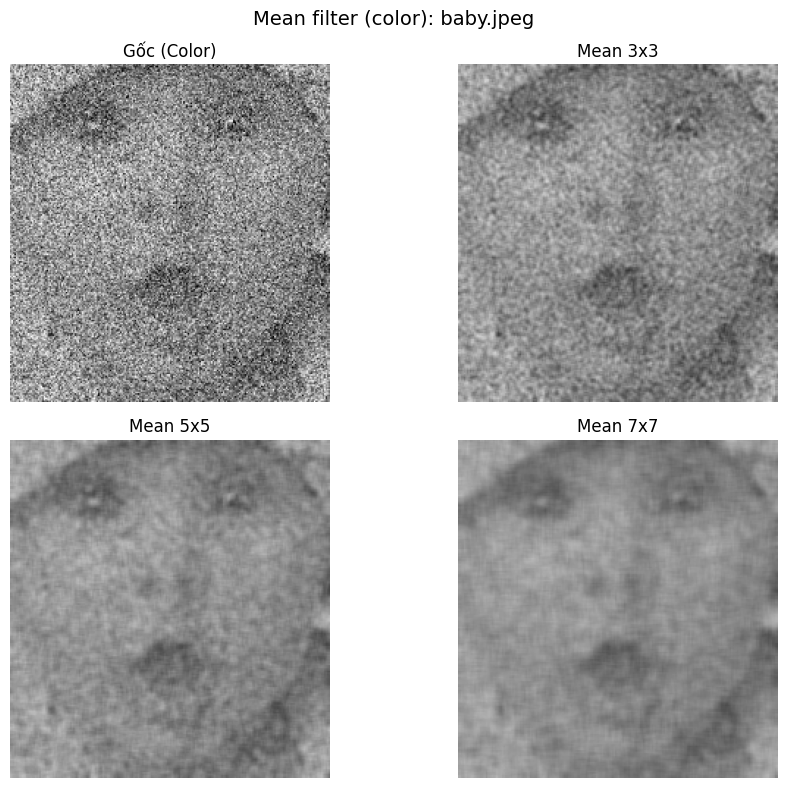

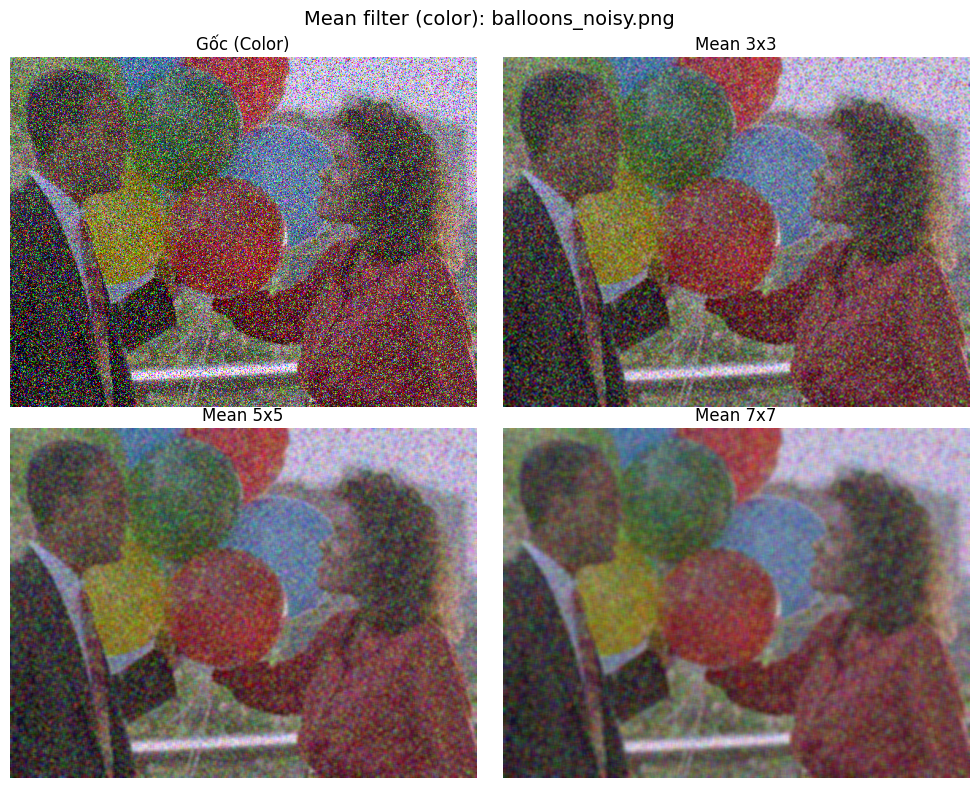

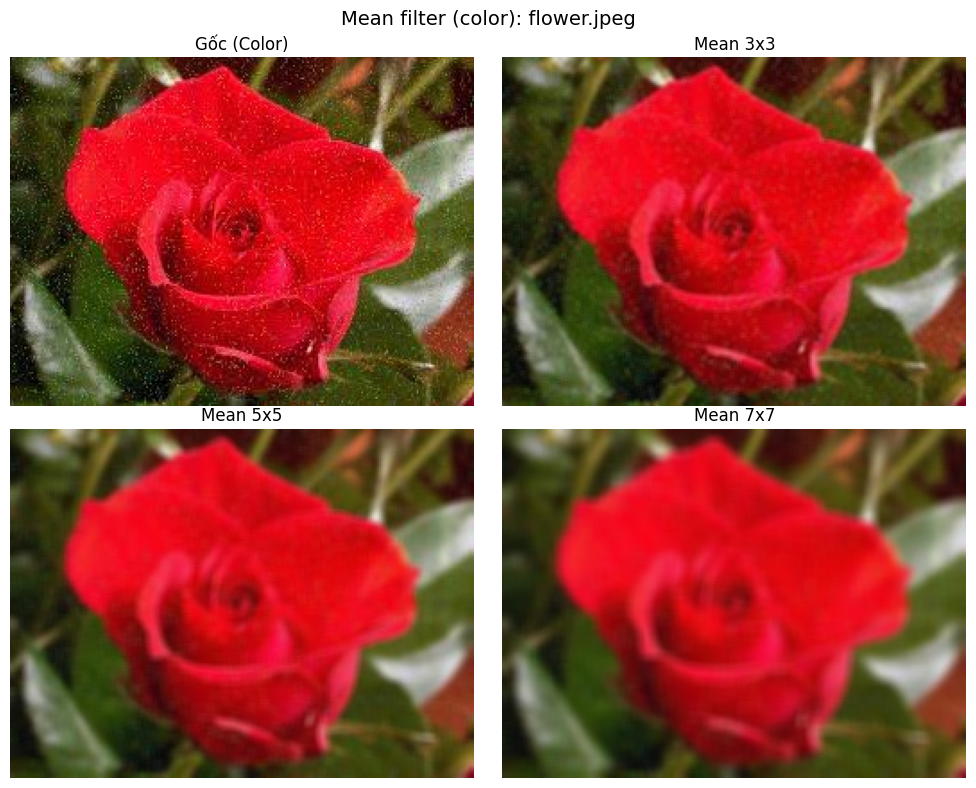

In [ ]:
#Bài 5
import numpy as np
import imageio.v2 as iio
import matplotlib.pylab as plt
import os

filenames = ['baby.jpeg', 'balloons_noisy.png', 'flower.jpeg']
folder = 'exercise'

# Hàm lọc trung bình cho 1 kênh
def mean_filter(image, kernel_size):
    pad = kernel_size // 2
    image_pad = np.pad(image, pad, mode='reflect')
    filtered = np.zeros_like(image)
    
    for i in range(filtered.shape[0]):
        for j in range(filtered.shape[1]):
            region = image_pad[i:i+kernel_size, j:j+kernel_size]
            filtered[i, j] = np.mean(region)
    
    return filtered.astype(np.uint8)

# Hàm áp dụng filter cho từng kênh màu
def apply_filter_color_image(img, kernel_size):
    result = np.zeros_like(img)
    for c in range(3):  # kênh R, G, B
        result[:, :, c] = mean_filter(img[:, :, c], kernel_size)
    return result

# Xử lý từng ảnh
for fname in filenames:
    path = os.path.join(folder, fname)
    if not os.path.exists(path):
        print(f"File không tồn tại: {path}")
        continue

    img = iio.imread(path)

    # Nếu ảnh xám, thêm 3 chiều
    if img.ndim == 2:
        img = np.stack([img] * 3, axis=-1)

    filtered_3 = apply_filter_color_image(img, 3)
    filtered_5 = apply_filter_color_image(img, 5)
    filtered_7 = apply_filter_color_image(img, 7)

    base = fname.split('.')[0]

    # Hiển thị ảnh
    plt.figure(figsize=(10, 8))
    plt.suptitle(f'Mean filter (color): {fname}', fontsize=14)

    plt.subplot(2, 2, 1)
    plt.imshow(img)
    plt.title('Gốc (Color)')
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.imshow(filtered_3)
    plt.title('Mean 3x3')
    plt.axis('off')

    plt.subplot(2, 2, 3)
    plt.imshow(filtered_5)
    plt.title('Mean 5x5')
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.imshow(filtered_7)
    plt.title('Mean 7x7')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

#Đánh giá:
# Mean 3×3: Làm mịn nhẹ, giữ chi tiết tốt, nhưng khử nhiễu yếu nếu nhiễu mạnh.
# Mean 5×5: Cân bằng giữa làm mịn và chi tiết.
# Mean 7×7: Khử nhiễu tốt nhất, nhưng làm ảnh mờ nhiều, mất chi tiết.


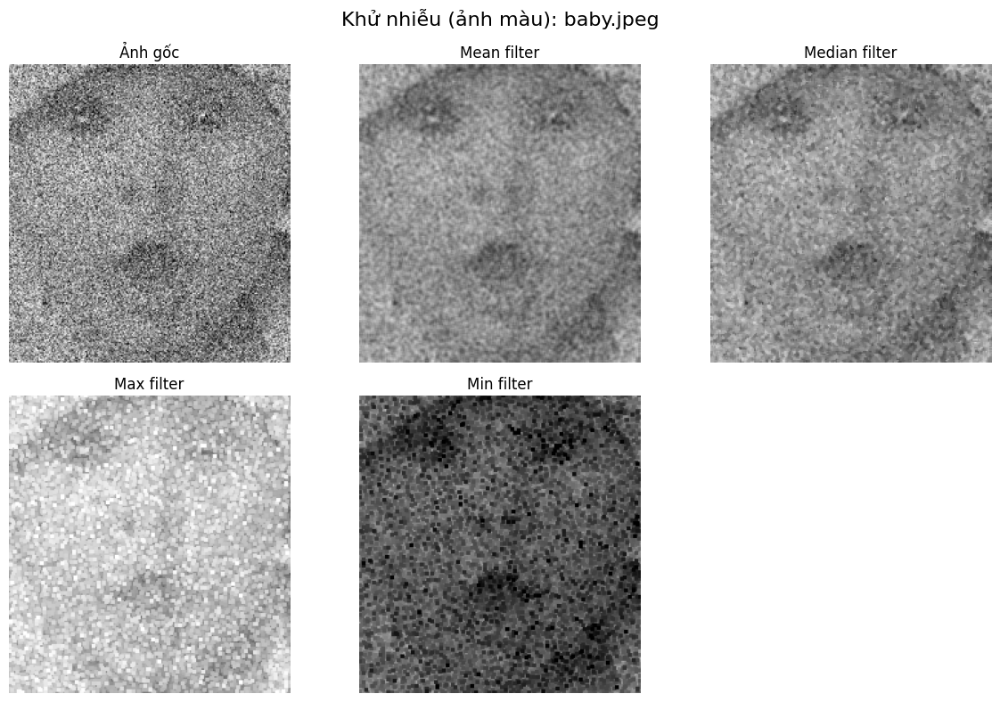

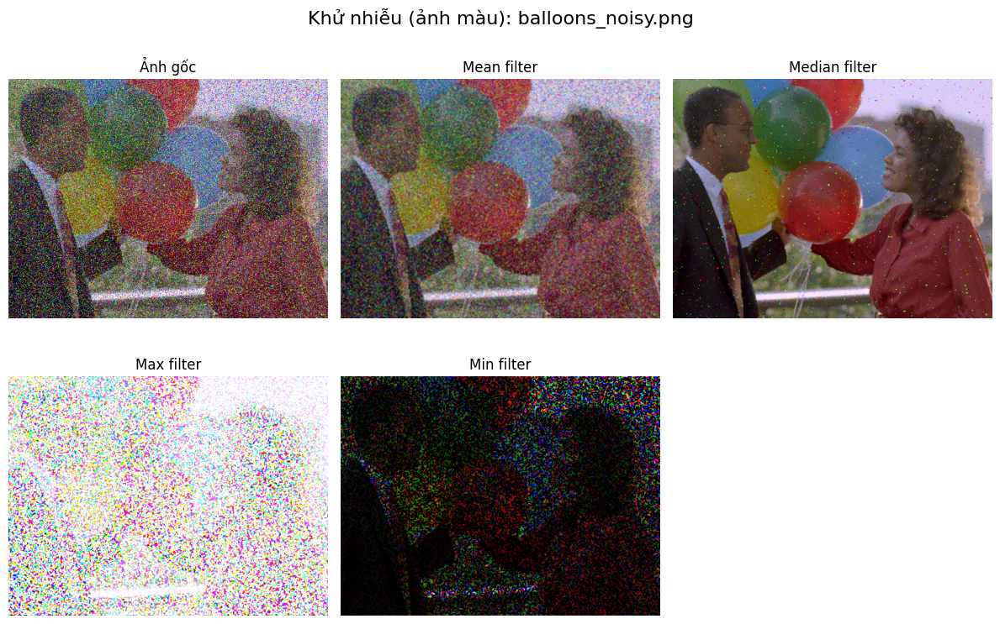

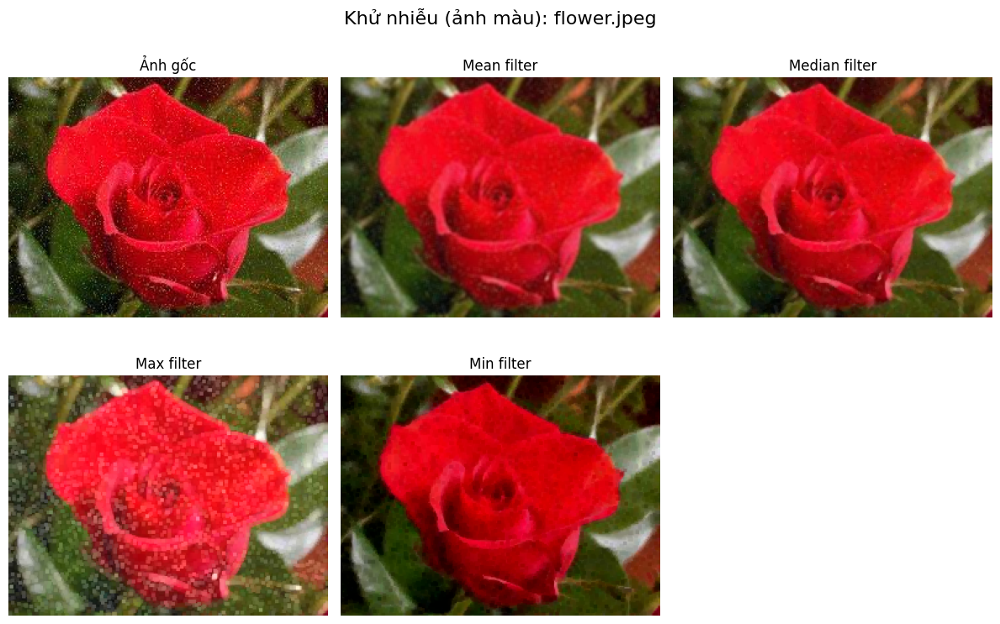

In [ ]:
#Bai 6
import numpy as np
import imageio.v2 as iio
import matplotlib.pyplot as plt
import os

folder = 'exercise'
filenames = ['baby.jpeg', 'balloons_noisy.png', 'flower.jpeg']

def generic_filter(image, k, func):
    pad = k // 2
    padded = np.pad(image, pad, mode='reflect')
    filtered = np.zeros_like(image)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded[i:i+k, j:j+k]
            filtered[i, j] = func(region)
    return filtered.astype(np.uint8)

def apply_filter_color_image(img, k, func):
    result = np.zeros_like(img)
    for c in range(3):  # R, G, B
        result[:, :, c] = generic_filter(img[:, :, c], k, func)
    return result

for fname in filenames:
    path = os.path.join(folder, fname)
    img = iio.imread(path)

    if img.ndim == 2: 
        img = np.stack([img]*3, axis=-1)

    ksize = 3

    mean_img = apply_filter_color_image(img, ksize, np.mean)
    median_img = apply_filter_color_image(img, ksize, np.median)
    max_img = apply_filter_color_image(img, ksize, np.max)
    min_img = apply_filter_color_image(img, ksize, np.min)

    plt.figure(figsize=(12, 8))
    plt.suptitle(f'Khử nhiễu (ảnh màu): {fname}', fontsize=16)

    plt.subplot(2, 3, 1)
    plt.imshow(img)
    plt.title('Ảnh gốc')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(mean_img)
    plt.title('Mean filter')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(median_img)
    plt.title('Median filter')
    plt.axis('off')

    plt.subplot(2, 3, 4)
    plt.imshow(max_img)
    plt.title('Max filter')
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.imshow(min_img)
    plt.title('Min filter')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    # Lưu kết quả
    base = os.path.splitext(fname)[0]

#Nhận xét:
# Trong các bộ lọc (mean, median, max, min), median filter (bộ lọc trung vị) thường khử nhiễu tốt nhất, đặc biệt với nhiễu dạng salt-and-pepper (nhiễu muối tiêu).
# Mean filter: Làm mịn ảnh, nhưng có thể làm mờ cạnh và không hiệu quả với nhiễu muối tiêu.
# Median filter: Loại bỏ tốt nhiễu muối tiêu mà vẫn giữ được cạnh sắc nét.
# Max/min filter: Chỉ phù hợp với một số loại nhiễu đặc biệt, không tốt bằng median filter cho đa số trường hợp, min filter có thể làm mất chi tiết ảnh làm tối ảnh, ngược lại max filter có thể làm sáng ảnh nhưng không khử nhiễu tốt.

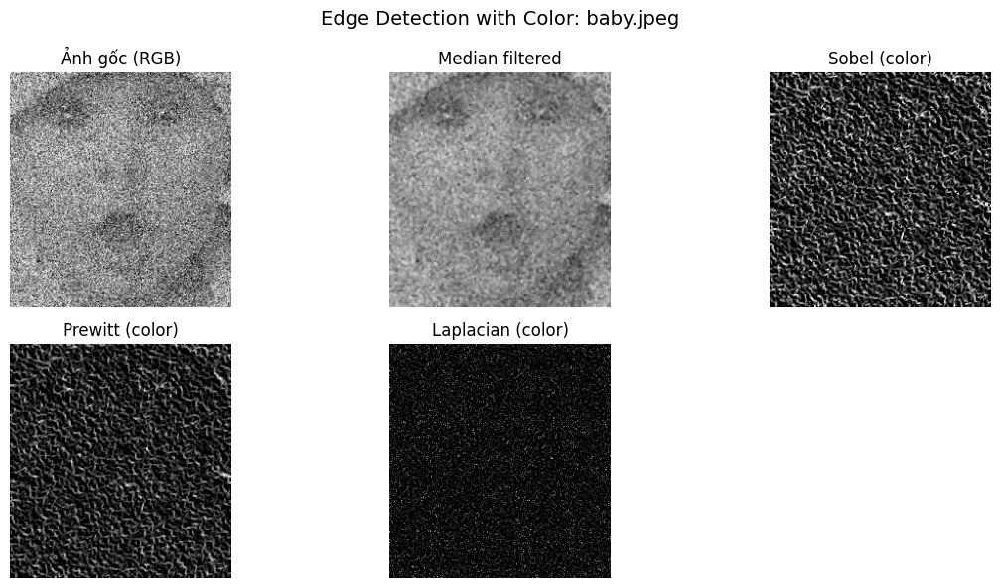

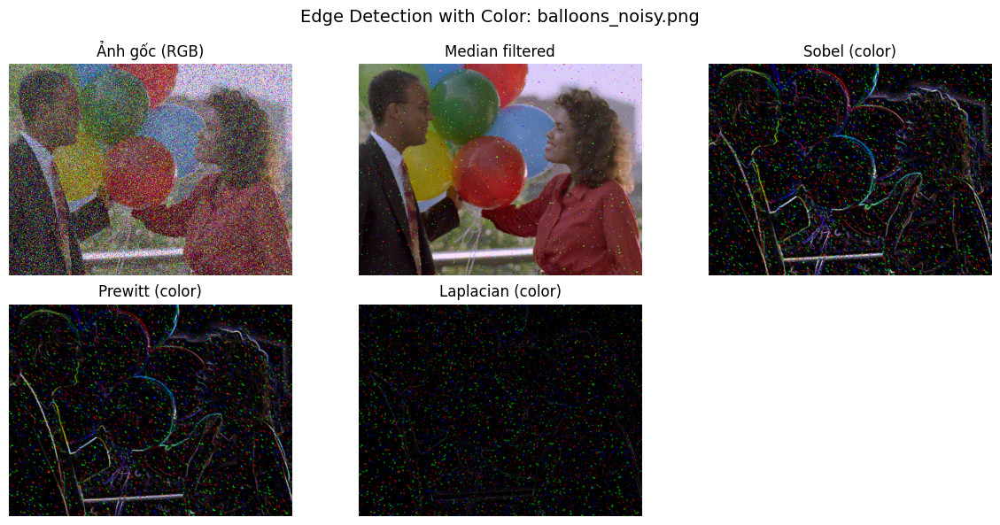

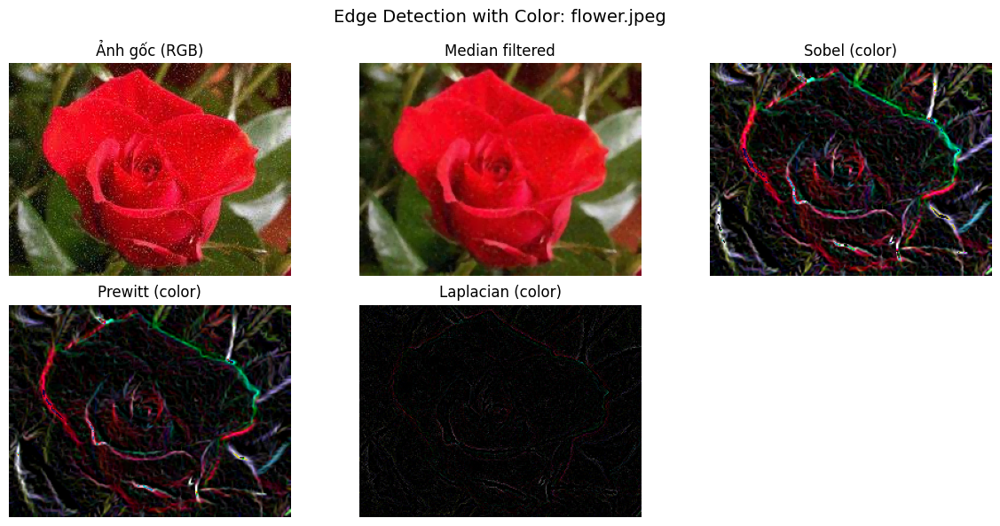

In [24]:
#Bài 7
import numpy as np
import imageio.v2 as iio
import matplotlib.pyplot as plt
import os

input_folder = 'exercise'
output_folder = 'Bai7_Image'
filenames = ['baby.jpeg', 'balloons_noisy.png', 'flower.jpeg']

# Tạo thư mục lưu ảnh nếu chưa có
os.makedirs(output_folder, exist_ok=True)

def median_filter(image, k=3):
    pad = k // 2
    padded = np.pad(image, ((pad, pad), (pad, pad)), mode='reflect')
    filtered = np.zeros_like(image)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded[i:i + k, j:j + k]
            filtered[i, j] = np.median(region)
    return filtered.astype(np.uint8)

def convolve(image, kernel):
    k = kernel.shape[0]
    pad = k // 2
    padded = np.pad(image, ((pad, pad), (pad, pad)), mode='reflect')
    output = np.zeros_like(image, dtype=float)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded[i:i + k, j:j + k]
            output[i, j] = np.sum(region * kernel)
    return np.clip(output, 0, 255).astype(np.uint8)

# Các kernel lọc biên
sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
sobel_y = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])
prewitt_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
prewitt_y = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])
laplacian = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])

for fname in filenames:
    path = os.path.join(input_folder, fname)
    img = iio.imread(path)

    if img.ndim == 2:  # nếu là ảnh xám, chuyển thành RGB
        img = np.stack([img]*3, axis=-1)

    # Median filter từng kênh màu
    denoised = np.zeros_like(img)
    for c in range(3):
        denoised[:, :, c] = median_filter(img[:, :, c], 3)

    def edge_detect(img_color, kx, ky=None):
        if ky is None:
            ky = kx
        edges = np.zeros_like(img_color)
        for c in range(3):
            gx = convolve(img_color[:, :, c], kx)
            gy = convolve(img_color[:, :, c], ky)
            edges[:, :, c] = np.hypot(gx, gy).astype(np.uint8)
        return edges

    sobel = edge_detect(denoised, sobel_x, sobel_y)
    prewitt = edge_detect(denoised, prewitt_x, prewitt_y)

    laplace = np.zeros_like(img)
    for c in range(3):
        laplace[:, :, c] = np.abs(convolve(denoised[:, :, c], laplacian)).astype(np.uint8)

    base = os.path.splitext(fname)[0]

    iio.imwrite(os.path.join(output_folder, f'{base}_denoised.png'), denoised)
    iio.imwrite(os.path.join(output_folder, f'{base}_sobel.png'), sobel)
    iio.imwrite(os.path.join(output_folder, f'{base}_prewitt.png'), prewitt)
    iio.imwrite(os.path.join(output_folder, f'{base}_laplacian.png'), laplace)

    
    plt.figure(figsize=(12, 6))
    plt.suptitle(f'Edge Detection with Color: {fname}', fontsize=14)

    plt.subplot(2, 3, 1)
    plt.imshow(img)
    plt.title('Ảnh gốc (RGB)')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(denoised)
    plt.title('Median filtered')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(sobel)
    plt.title('Sobel (color)')
    plt.axis('off')

    plt.subplot(2, 3, 4)
    plt.imshow(prewitt)
    plt.title('Prewitt (color)')
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.imshow(laplace)
    plt.title('Laplacian (color)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

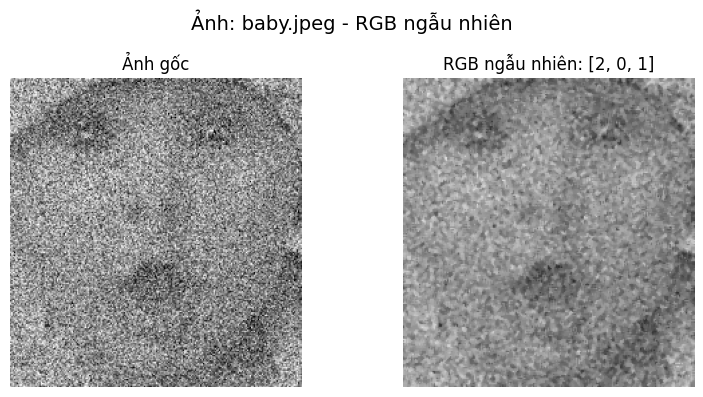

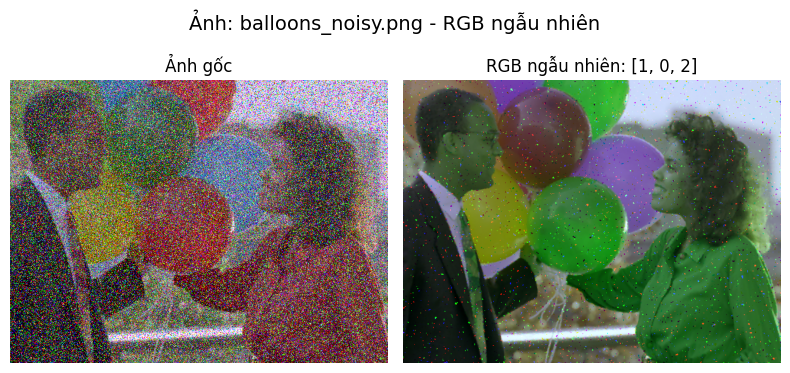

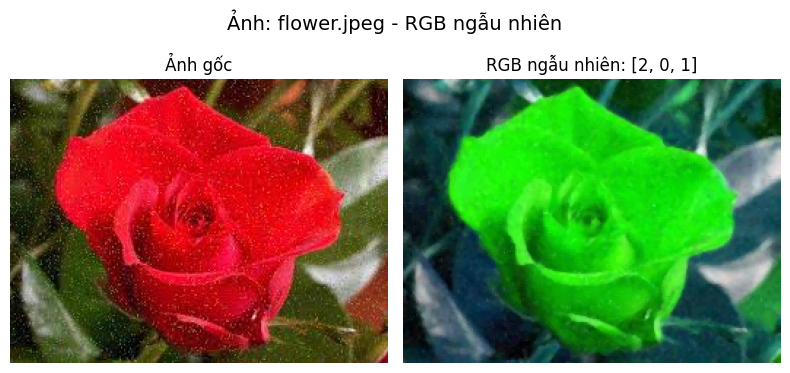

In [26]:
#Bài 8
import numpy as np
import imageio.v2 as iio
import os
import random

input_folder = 'exercise'
output_folder = 'Bai8_Image'
filenames = ['baby.jpeg', 'balloons_noisy.png', 'flower.jpeg']

os.makedirs(output_folder, exist_ok=True)

# Hàm median filter cho từng kênh màu
def median_filter(image, k=3):
    pad = k // 2
    padded = np.pad(image, ((pad, pad), (pad, pad)), mode='reflect')
    filtered = np.zeros_like(image)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded[i:i+k, j:j+k]
            filtered[i, j] = np.median(region)
    return filtered.astype(np.uint8)

# Xử lý từng ảnh
for fname in filenames:
    path = os.path.join(input_folder, fname)
    img = iio.imread(path)

    if img.ndim == 2:
        img = np.stack([img]*3, axis=-1)

    # Khử nhiễu bằng median filter cho từng kênh
    denoised = np.zeros_like(img)
    for c in range(3):
        denoised[:, :, c] = median_filter(img[:, :, c], 3)

    # Đổi màu RGB ngẫu nhiên bằng cách hoán vị các kênh
    channels = [0, 1, 2]
    random.shuffle(channels)
    img_random = denoised[:, :, channels]

    #ảnh gốc và ảnh đã đổi màu
    plt.figure(figsize=(8, 4))
    plt.suptitle(f'Ảnh: {fname} - RGB ngẫu nhiên', fontsize=14)

    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title('Ảnh gốc')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(img_random)
    plt.title(f'RGB ngẫu nhiên: {channels}')
    plt.axis('off')

    plt.tight_layout()
    plt.show()
    # Tạo tên ảnh mới và lưu
    base = os.path.splitext(fname)[0]
    out_path = os.path.join(output_folder, f'{base}_randomRGB.png')
    iio.imwrite(out_path, img_random)


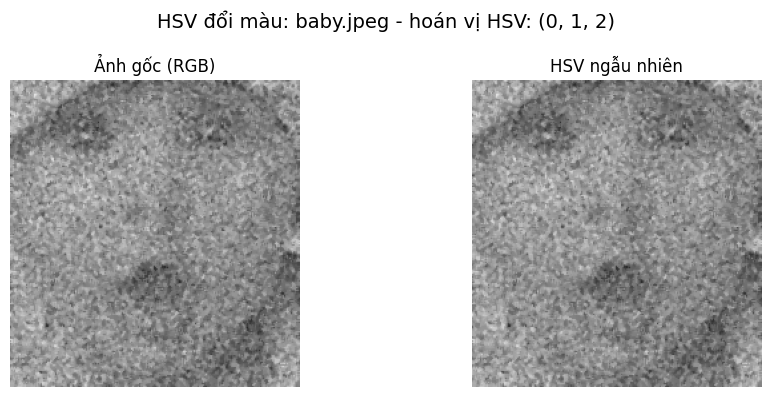

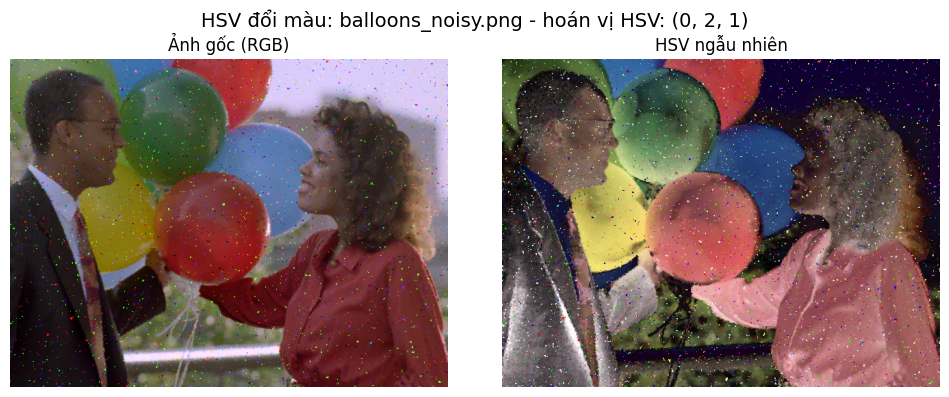

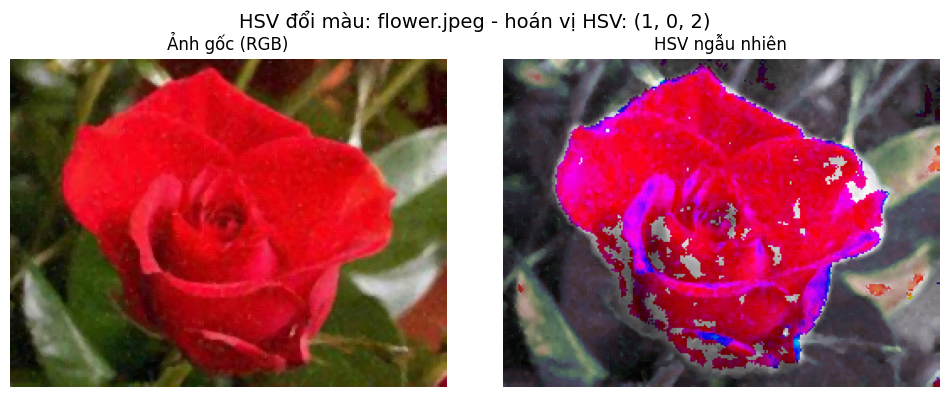

In [1]:
#Bài 9
import numpy as np
import imageio.v2 as iio
import matplotlib.pyplot as plt
import os
import colorsys
import random

input_folder = 'exercise'
output_folder = 'Bai9_Image'
filenames = ['baby.jpeg', 'balloons_noisy.png', 'flower.jpeg']
os.makedirs(output_folder, exist_ok=True)

def median_filter(image, k=3):
    pad = k // 2
    padded = np.pad(image, ((pad, pad), (pad, pad)), mode='reflect')
    filtered = np.zeros_like(image)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded[i:i+k, j:j+k]
            filtered[i, j] = np.median(region)
    return filtered.astype(np.uint8)

hsv_permutations = [
    (0, 1, 2), (0, 2, 1), (1, 0, 2),
    (1, 2, 0), (2, 0, 1), (2, 1, 0)
]

for idx, fname in enumerate(filenames):
    path = os.path.join(input_folder, fname)
    img = iio.imread(path)

    if img.ndim == 2:  
        img = np.stack([img]*3, axis=-1)

    denoised = np.zeros_like(img)
    for c in range(3):
        denoised[:, :, c] = median_filter(img[:, :, c], 3)

    rgb_norm = denoised.astype(np.float32) / 255.0
    hsv = np.zeros_like(rgb_norm)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            hsv[i, j] = colorsys.rgb_to_hsv(*rgb_norm[i, j])

    perm = hsv_permutations[idx % len(hsv_permutations)]
    hsv_swapped = hsv[:, :, list(perm)]

    rgb_new = np.zeros_like(hsv_swapped)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            rgb_new[i, j] = colorsys.hsv_to_rgb(*hsv_swapped[i, j])

    rgb_new_uint8 = (rgb_new * 255).clip(0, 255).astype(np.uint8)

    plt.figure(figsize=(10, 4))
    plt.suptitle(f'HSV đổi màu: {fname} - hoán vị HSV: {perm}', fontsize=14)

    plt.subplot(1, 2, 1)
    plt.imshow(denoised)
    plt.title('Ảnh gốc (RGB)')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(rgb_new_uint8)
    plt.title('HSV ngẫu nhiên')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    base = os.path.splitext(fname)[0]
    out_path = os.path.join(output_folder, f'{base}_HSV_random.png')
    iio.imwrite(out_path, rgb_new_uint8)
